In [71]:
from crypto_package import get_candles
from crypto_package.backtesting import plot_profit, plot_candles, BacktestingBot, plot_indicators
import talib.abstract as ta

In [72]:
import datetime
from pandas import to_datetime
import plotly.graph_objects as go
from random import randint
def plot_patterns_on_candles(indicators_df, indicators, trades=None, pair=None, show_signal=False, lines=[], width: int = 1000,
                    height: int = 650):  # indicators_df contains columns with indicators and column "date" with datetime
    if "time" in indicators_df.columns:
        indicators_df = indicators_df.rename(columns={"time": "date"})
    if type(indicators_df["date"][0]) is not datetime:
        indicators_df["date"] = to_datetime(indicators_df["date"], unit='s')

    fig = go.Figure()

    fig.add_trace(go.Candlestick(
        x=indicators_df['date'],
        open=indicators_df['open'],
        high=indicators_df['high'],
        low=indicators_df['low'],
        close=indicators_df['close']))

    for ind in indicators:
        xup =[]
        xdown = []
        yup = []
        ydown = []
        
        for idx, row in indicators_df.iterrows():
            if row[ind]==100:
                xup.append(row['date'])
                yup.append(((row['high']+row['low'])/2)+1.5*abs(row['high']-row['low']))
            elif row[ind]==-100:
                xdown.append(row['date'])
                ydown.append(((row['high']+row['low'])/2)-1.5*abs(row['high']-row['low']))
        
        color = 'green' if len(indicators)<=2 else randint(1,500)
        fig.add_trace(go.Scatter(
            x=xup,
            y=yup,
            mode='markers',
            marker=dict(
                color=color,
                line_width=1,
                size=8,
            ),
            marker_symbol='triangle-up',
            name=ind+" bullish",
        ))
        color = 'red' if len(indicators)<=2 else randint(1,500)
        fig.add_trace(go.Scatter(
            x=xdown,
            y=ydown,
            mode='markers',
            marker=dict(
                color=color,
                line_width=1,
                size=8,
            ),
            marker_symbol='triangle-down',
            name=ind+" bearish",
        ))
    
    for line in lines:
        fig.add_trace(go.Scatter(
            x=indicators_df["date"],
            y=indicators_df[line],
            mode='lines',
            name=line,
        ))
    
    if trades is not None:
        res = trades.trades

        if pair is not None:
            res = [t for t in trades.trades if t.pair == pair]

        buy_trades_price = [tr.price for tr in res if tr.is_buy]
        buy_trades_time = [tr.timestamp for tr in res if tr.is_buy]

        sell_trades_price = [tr.price for tr in res if not tr.is_buy]
        sell_trades_time = [tr.timestamp for tr in res if not tr.is_buy]

        fig.add_trace(go.Scatter(
            x=buy_trades_time,
            y=buy_trades_price,
            mode='markers',
            name='buy trades',
            marker_symbol='diamond',
            marker=dict(
                color='blue',
                line_width=2,
                size=7,

            )
        ))

        fig.add_trace(go.Scatter(
            x=sell_trades_time,
            y=sell_trades_price,
            mode='markers',
            name='sell trades',
            marker_symbol='square',
            marker=dict(
                color='yellow',
                line_width=2,
                size=7
            )
        ))
        
        if show_signal:
            buy_sig = [a[0] for a in trades.buy_signals]
            buy_sig_time = [a[1] for a in trades.buy_signals]
            
            sell_sig = [a[0] for a in trades.sell_signals]
            sell_sig_time = [a[1] for a in trades.sell_signals]
            fig.add_trace(go.Scatter(
                x=buy_sig_time,
                y=buy_sig,
                mode='markers',
                name='buy signal',
                marker_symbol='diamond',
                marker=dict(
                    color='lightblue',
                    line_width=2,
                    size=7,

                )
            ))

            fig.add_trace(go.Scatter(
                x=sell_sig_time,
                y=sell_sig,
                mode='markers',
                name='sell signal',
                marker_symbol='square',
                marker=dict(
                    color='lightyellow',
                    line_width=2,
                    size=7
                )
            ))
    
    fig.update_layout(
        title="Indicators on candles",
        xaxis_title="time",
        yaxis_title="value",
        width=width,
        height=height
    )
    fig.show()

    
    
    
    
from plotly.subplots import make_subplots

def plot_indicators(indicators_df, indicators, trades=None, pair=None, show_signal=False, plot_candles=False, one_plot=None, width: int = 1000, height: int = 650, fig_type:str='lines'):  # indicators_df contains columns with indicators and column "date" with datetime
    if "time" in indicators_df.columns:
        indicators_df = indicators_df.rename(columns={"time": "date"})
    if type(indicators_df["date"][0]) is not datetime:
        indicators_df["date"] = to_datetime(indicators_df["date"], unit='s')
   
    rows = 0
    indicators_titles = []
    
    if plot_candles or trades is not None:
        rows += 1
        indicators_titles = ['candles']
    
    if one_plot is not None:
        for idx,i in enumerate(one_plot):
            if i==False:
                rows += 1
                indicators_titles.append(indicators[idx])
            else:
                title = indicators_titles.pop() if len(indicators_titles)>0 else ""
                title = title + " + " + str(indicators[idx])
                indicators_titles.append(title)
    else:
        rows += len(indicators)
        indicators_titles += [i for i in indicators]
        
    
   
    
    print(indicators_titles)
    fig = make_subplots(rows=rows, cols=1, 
                        subplot_titles=indicators_titles,
                        shared_xaxes=True,
                        vertical_spacing=0.05)
    
    ridx = 0
    if plot_candles or trades is not None:
        ridx = 1
        fig.add_trace(go.Candlestick(
            x=indicators_df['date'],
            open=indicators_df['open'],
            high=indicators_df['high'],
            low=indicators_df['low'],
            close=indicators_df['close']), row=ridx, col=1
                      )

        
        if trades is not None:
            res = trades.trades

            if pair is not None:
                res = [t for t in trades.trades if t.pair == pair]

            buy_trades_price = [tr.price for tr in res if tr.is_buy]
            buy_trades_time = [tr.timestamp for tr in res if tr.is_buy]

            sell_trades_price = [tr.price for tr in res if not tr.is_buy]
            sell_trades_time = [tr.timestamp for tr in res if not tr.is_buy]

            fig.add_trace(go.Scatter(
                x=buy_trades_time,
                y=buy_trades_price,
                mode='markers',
                name='buy trades',
                marker_symbol='diamond',
                marker=dict(
                    color='blue',
                    line_width=2,
                    size=7,

                )
            ),row=ridx, col=1)

            fig.add_trace(go.Scatter(
                x=sell_trades_time,
                y=sell_trades_price,
                mode='markers',
                name='sell trades',
                marker_symbol='square',
                marker=dict(
                    color='yellow',
                    line_width=2,
                    size=7
                )
            ),row=ridx, col=1)

            if show_signal:
                buy_sig = [a[0] for a in trades.buy_signals]
                buy_sig_time = [a[1] for a in trades.buy_signals]

                sell_sig = [a[0] for a in trades.sell_signals]
                sell_sig_time = [a[1] for a in trades.sell_signals]
                fig.add_trace(go.Scatter(
                    x=buy_sig_time,
                    y=buy_sig,
                    mode='markers',
                    name='buy signal',
                    marker_symbol='diamond',
                    marker=dict(
                        color='lightblue',
                        line_width=2,
                        size=7,

                    )
                ),row=ridx, col=1)

                fig.add_trace(go.Scatter(
                    x=sell_sig_time,
                    y=sell_sig,
                    mode='markers',
                    name='sell signal',
                    marker_symbol='square',
                    marker=dict(
                        color='lightyellow',
                        line_width=2,
                        size=7
                    )
                ),row=ridx, col=1)
        
        
    for idx,ind in enumerate(indicators):
        if one_plot is None or one_plot[idx]==False:
            ridx += 1
            
        fig.add_trace(go.Scatter(
            x=indicators_df['date'],
            y=indicators_df[ind],
            name = ind,
            line_color='rgb'+str((randint(0,255),randint(0,255),randint(0,255)))
            ),
            row = ridx, 
            col = 1
        )
        
    fig.update_layout(
        title_text='indicators',
        # xaxis_title="time",
        # yaxis_title="value",
        width=width,
        height=height,
        xaxis_rangeslider_visible=False,
        
    )
    fig.show()

In [73]:
# bot_ma = BacktestingBot('simple_strategy/config.yml')
# results_ma = bot_ma.test_strategy(calc_indicators_simple_rsi_ma, check_buy_signals_simple_rsi_ma, check_sell_signals_simple_rsi_ma, time_start=datetime.datetime(2021,12,1))
# plot_candles(candles, results_rsi)

candles, _ = get_candles('binance', 'BTC/USDT', '15m', time_start=datetime.datetime(2021,12,1))

candles['sma'] = ta.SMA(candles, timeperiod=20)
candles['ema'] = ta.EMA(candles, timeperiod=20)
candles['rsi'] = ta.RSI(candles, timeperiod=10)

# results_rsi = bot_rsi.test_strategy(calc_indicators_simple_1, check_buy_signals_simple_1, check_sell_signals_simple_1, time_start=datetime.datetime(2021,12,1))
# plot_indicators(candles, [],trades=results_rsi, show_signal=True, width=1800, height=1000)
# plot_profit(results_rsi)
# plot_indicators(candles, ['sma','ema','rsi'], one_plot=[True,True,False],trades=results_ma, show_signal=True, width=1800, height=1000)
# plot_profit(results_ma)

['candles', 'roc']


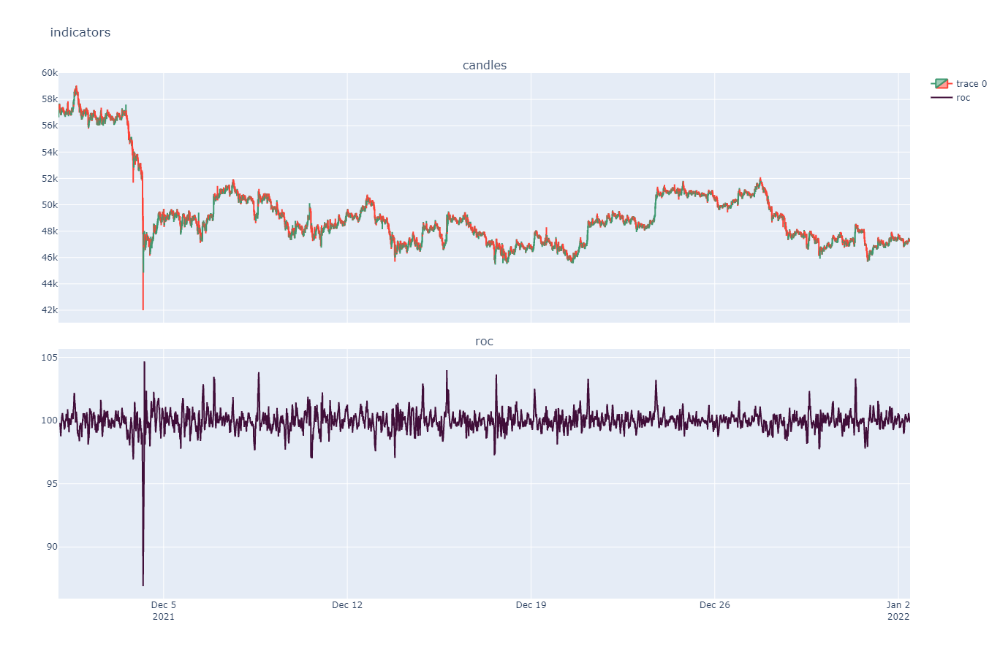

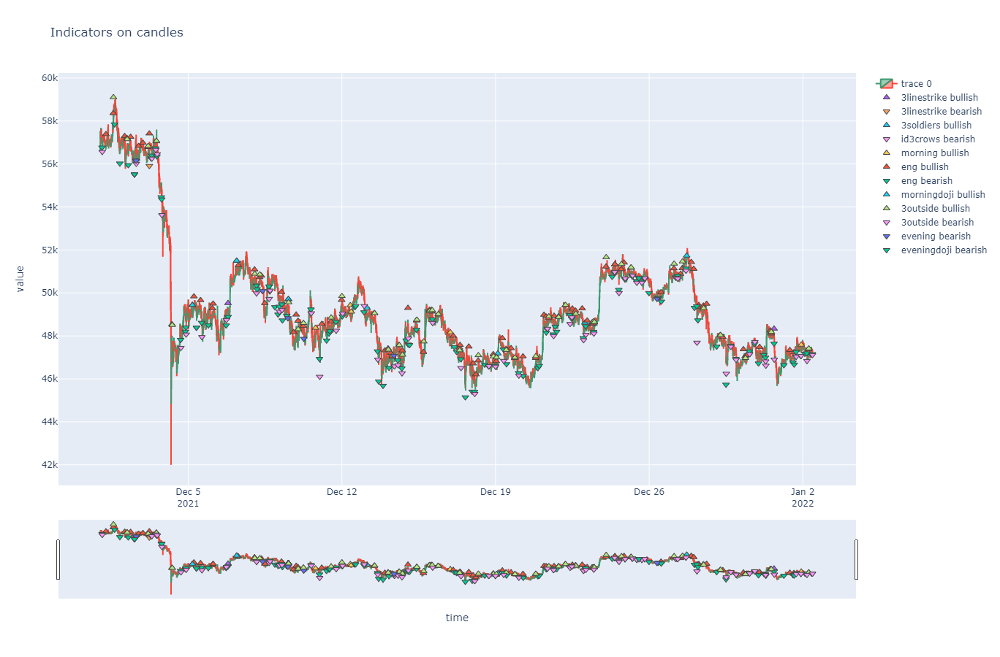

In [74]:
candles['3stars'] = ta.CDL3STARSINSOUTH(candles)
candles['3linestrike'] = ta.CDL3LINESTRIKE(candles)
candles['3soldiers'] = ta.CDL3WHITESOLDIERS(candles)
candles['id3crows'] = ta.CDLIDENTICAL3CROWS(candles)
candles['morning'] = ta.CDLMORNINGSTAR(candles)
candles['eng'] = ta.CDLENGULFING(candles)
candles['3crows'] = ta.CDL3BLACKCROWS(candles)
candles['morningdoji'] = ta.CDLMORNINGDOJISTAR(candles)
candles['3outside'] = ta.CDL3OUTSIDE(candles)
candles['evening'] = ta.CDLEVENINGSTAR(candles)
candles['eveningdoji'] = ta.CDLEVENINGDOJISTAR(candles)

candles['roc'] = ta.ROCR100(candles, timeperiod=5)


plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, width=1350, height=900)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], width=1350, height=900)

In [57]:
%%writefile patterns_strategy/config.yml
# example of bot_entity configuration

 # units of cryptocurrency used by bot_entity to make one buy trade
transaction_amount: 100

# if transaction value will fall by the stop_loss value (percentages), relative to its purchase price, bot_entity will sell it
stop_loss: 20 

# exchange on which bot_entity trades: binance
exchange: binance 

# pairs used to trade (the same strategy will be run on each one): e.g. -BTC/USDT
currency_pairs:
  - BTC/USDT
  
# candle interval. See constraints.yml for available candles
timeframe: 15m 

# from which time do you want to start calculating indicators (select this or last_n_candles): datetime - yyy-mm-dd hh:mm:ss eg. 
#time_start: '2019-06-01 12:22:00'

# based on how many candles do you want to calculate indicators (select this or start_time)
last_n_candles: 200 

# if True when sell signal occurs sell all owned amount of cryptocurrency; if False sell amount on sungle buy transaction
sell_all: True

# in minutes - how long to wait before transaction cancellation (needs to be bigger than zero)
timeout: 30

# maximum number of open trades for bot (for trades of all pairs)
max_open_trades: 10


Overwriting patterns_strategy/config.yml


In [75]:
# %load template_strategy.py

import talib.abstract as ta



def calc_indicators_roc( candles):
    candles['rsi'] = ta.RSI(candles, timeperiod=10)
    candles['roc'] = ta.ROCR100(candles, timeperiod=5)
    
    candles['3stars'] = ta.CDL3STARSINSOUTH(candles)
    candles['3linestrike'] = ta.CDL3LINESTRIKE(candles)
    candles['3soldiers'] = ta.CDL3WHITESOLDIERS(candles)
    candles['id3crows'] = ta.CDLIDENTICAL3CROWS(candles)
    candles['morning'] = ta.CDLMORNINGSTAR(candles)
    candles['eng'] = ta.CDLENGULFING(candles)
    candles['3crows'] = ta.CDL3BLACKCROWS(candles)
    candles['morningdoji'] = ta.CDLMORNINGDOJISTAR(candles)
    candles['3outside'] = ta.CDL3OUTSIDE(candles)
    candles['evening'] = ta.CDLEVENINGSTAR(candles)
    candles['eveningdoji'] = ta.CDLEVENINGDOJISTAR(candles)
    return candles

def check_buy_signals_patterns_roc(indicators):
    buy = False
    
    def find_min_price(indicators, interval, price_type):
        fmin_price = 1.7976931348623157e+308
        fmin_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] < fmin_price:
                fmin_price = indicators.iloc[i][price_type]
                fmin_idx = i
        return fmin_idx, fmin_price
    
    def find_max_price(indicators, interval, price_type):
        fmax_price = -1
        fmax_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] > fmax_price:
                fmax_price = indicators.iloc[i][price_type]
                fmax_idx = i
        return fmax_idx, fmax_price
    
    if ((indicators.iloc[-1]['3stars']==100) or
        (indicators.iloc[-1]['3linestrike']==-100) or
        (indicators.iloc[-1]['3soldiers']==100) or
        (indicators.iloc[-1]['morning']==100) or
        (indicators.iloc[-1]['3outside']==100) or
        (indicators.iloc[-1]['morningdoji']==100)): # sygnał wzrostu
        
        act_roc = indicators.iloc[-1]['roc']
        if act_roc >= 100:
            idx, max_price = find_max_price(indicators, 60, 'close')
            act_price = indicators.iloc[-1]['close']
            price_diff = act_price - max_price
        else:
            idx, min_price = find_min_price(indicators, 60, 'close')
            act_price = indicators.iloc[-1]['close']
            price_diff = act_price - min_price
            
        roc = indicators.iloc[idx]['roc']
        
        roc_diff = act_roc - roc
        
        if roc_diff > 0 and price_diff < 0: 
            buy = True
        # elif roc_diff >=0 and price_diff >= 0: 
        #     buy = True
    
    return buy


def check_sell_signals_patterns_roc(indicators):
    sell = False
    
    def find_max_price(indicators, interval, price_type):
        fmax_price = -1
        fmax_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] > fmax_price:
                fmax_price = indicators.iloc[i][price_type]
                fmax_idx = i
        return fmax_idx, fmax_price
    
    def find_min_price(indicators, interval, price_type):
        fmin_price = 1.7976931348623157e+308
        fmin_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] < fmin_price:
                fmin_price = indicators.iloc[i][price_type]
                fmin_idx = i
        return fmin_idx, fmin_price
    
    if(indicators.iloc[-1]['id3crows']==-100 or
        indicators.iloc[-1]['eng']==-100 or 
        indicators.iloc[-1]['3crows']==-100 or
        indicators.iloc[-1]['evening']==-100 or
        indicators.iloc[-1]['3linestrike']==100 or
        indicators.iloc[-1]['eveningdoji']==-100):
        
        act_roc = indicators.iloc[-1]['roc']
        if act_roc >= 100:
            idx, max_price = find_max_price(indicators, 60, 'close')
            act_price = indicators.iloc[-1]['close']
            price_diff = act_price - max_price
        else:
            idx, min_price = find_min_price(indicators, 60, 'close')
            act_price = indicators.iloc[-1]['close']
            price_diff = act_price - min_price
            
        roc = indicators.iloc[idx]['roc']
        
        roc_diff = act_roc - roc
        
        if roc_diff < 0 and price_diff > 0:
            sell = True
        # elif roc_diff <= 0 and price_diff <= 0:
        #     sell = True        
    
    return sell



In [76]:
bot_roc = BacktestingBot('patterns_strategy/config.yml')
roc_results = bot_roc.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc, check_sell_signals_patterns_roc, time_start = datetime.datetime(2021,12,1))

/tmp/ipykernel_360/983452744.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/983452744.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/983452744.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/98345

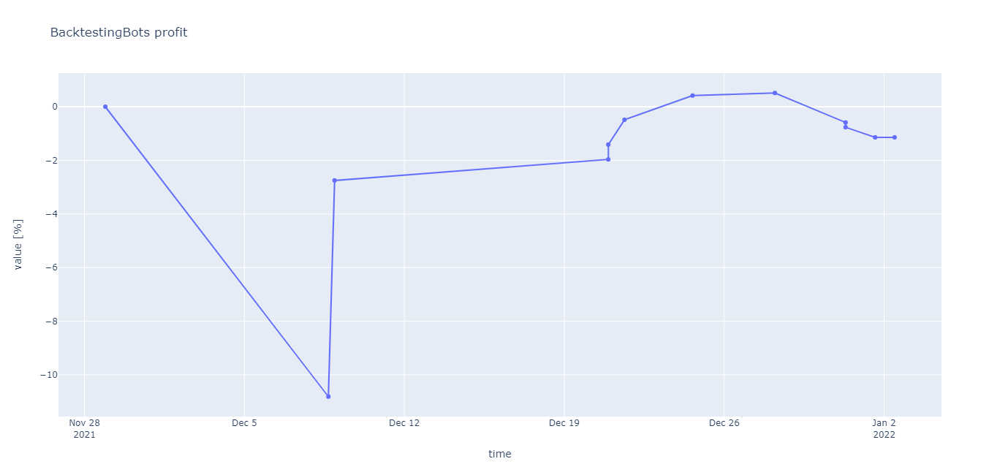

['candles', 'roc']


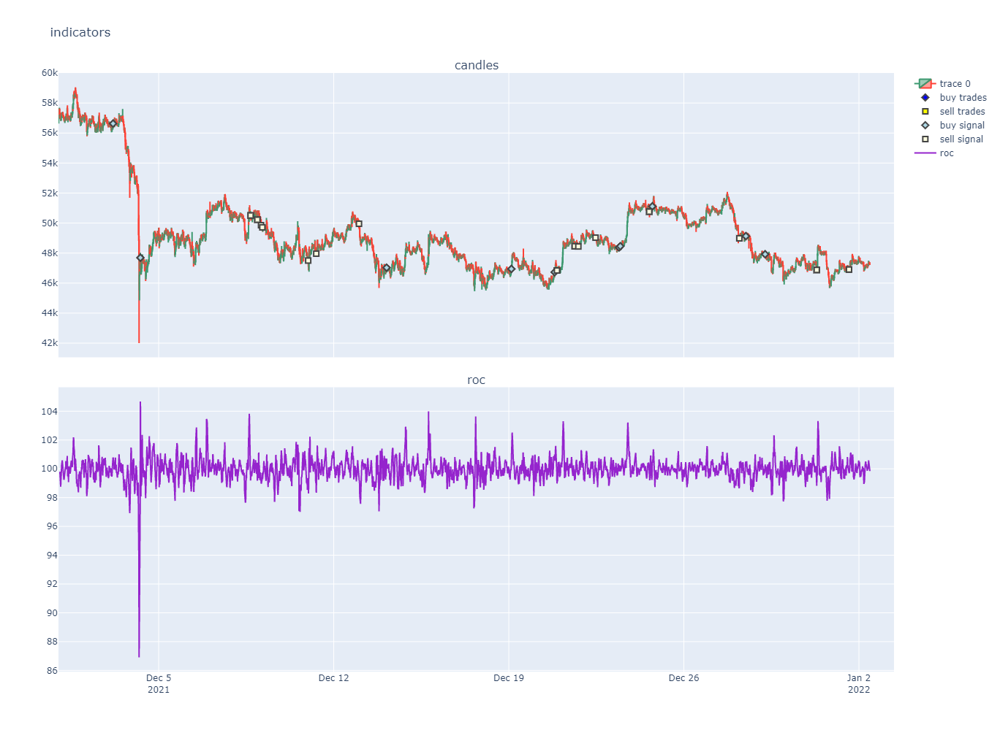

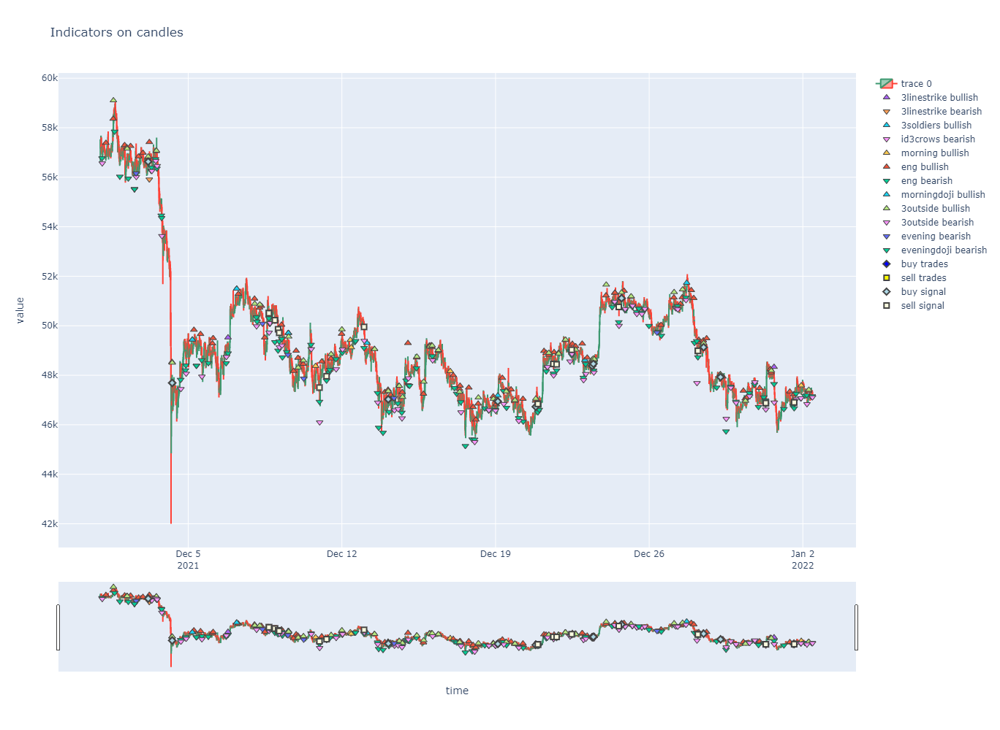

In [77]:
# bot_roc = BacktestingBot('patterns_strategy/config.yml')
# roc_results = bot_roc.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc, check_sell_signals_patterns_roc, time_start = datetime.datetime(2021,12,2))
plot_profit(roc_results)
plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, trades = roc_results, show_signal=True, width=1800, height=1000)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], trades=roc_results, show_signal=True,width=1800, height=1000)

można dodać thresholdy w jakich ma być cena

In [68]:
def check_buy_signals_patterns_roc_sig(indicators):
    buy = False
    
#     def find_min_price(indicators, interval, price_type):
#         fmin_price = 1.7976931348623157e+308
#         fmin_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] < fmin_price:
#                 fmin_price = indicators.iloc[i][price_type]
#                 fmin_idx = i
#         return fmin_idx, fmin_price
    
#     def find_max_price(indicators, interval, price_type):
#         fmax_price = -1
#         fmax_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] > fmax_price:
#                 fmax_price = indicators.iloc[i][price_type]
#                 fmax_idx = i
#         return fmax_idx, fmax_price
    
    if ((indicators.iloc[-1]['3stars']==100) or
        (indicators.iloc[-1]['3linestrike']==-100) or
        (indicators.iloc[-1]['3soldiers']==100) or
        (indicators.iloc[-1]['morning']==100) or
        indicators.iloc[-1]['eng']==100 or 
        (indicators.iloc[-1]['3outside']==100) or
        (indicators.iloc[-1]['morningdoji']==100)): # sygnał wzrostu
        
        hist_roc = indicators.iloc[-2]['roc']
        act_roc = indicators.iloc[-1]['roc']
        if hist_roc<=99.8 and act_roc>=100.2:
            buy = True
#         act_roc = indicators.iloc[-1]['roc']
#         if act_roc >= 100:
#             idx, max_price = find_max_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - max_price
#         else:
#             idx, min_price = find_min_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - min_price
            
#         roc = indicators.iloc[idx]['roc']
        
#         roc_diff = act_roc - roc
        
#         if roc_diff > 0 and price_diff <= 0: 
#             buy = True
#         elif roc_diff >=0 and price_diff >= 0: 
#             buy = True
    
    return buy


def check_sell_signals_patterns_roc_sig(indicators):
    sell = False
    
#     def find_max_price(indicators, interval, price_type):
#         fmax_price = -1
#         fmax_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] > fmax_price:
#                 fmax_price = indicators.iloc[i][price_type]
#                 fmax_idx = i
#         return fmax_idx, fmax_price
    
#     def find_min_price(indicators, interval, price_type):
#         fmin_price = 1.7976931348623157e+308
#         fmin_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] < fmin_price:
#                 fmin_price = indicators.iloc[i][price_type]
#                 fmin_idx = i
#         return fmin_idx, fmin_price
    
    if(indicators.iloc[-1]['id3crows']==-100 or
        indicators.iloc[-1]['eng']==-100 or 
        indicators.iloc[-1]['3crows']==-100 or
        indicators.iloc[-1]['evening']==-100 or
        indicators.iloc[-1]['3linestrike']==100 or
        indicators.iloc[-1]['eveningdoji']==-100):
        
        hist_roc = indicators.iloc[-2]['roc']
        act_roc = indicators.iloc[-1]['roc']
        if hist_roc>100 and act_roc<=99.8:
            sell = True
#         if act_roc >= 100:
#             idx, max_price = find_max_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - max_price
#         else:
#             idx, min_price = find_min_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - min_price
            
#         roc = indicators.iloc[idx]['roc']
        
#         roc_diff = act_roc - roc
        
#         if roc_diff < 0 and price_diff >= 0:
#             sell = True
#         elif roc_diff <= 0 and price_diff <= 0:
#             sell = True        
    
    return sell



/tmp/ipykernel_360/246763630.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/24676

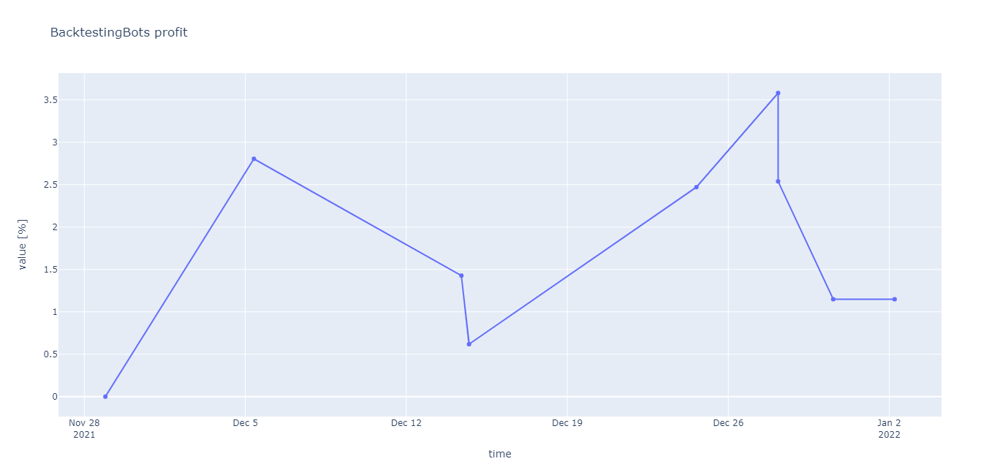

['candles', 'roc']


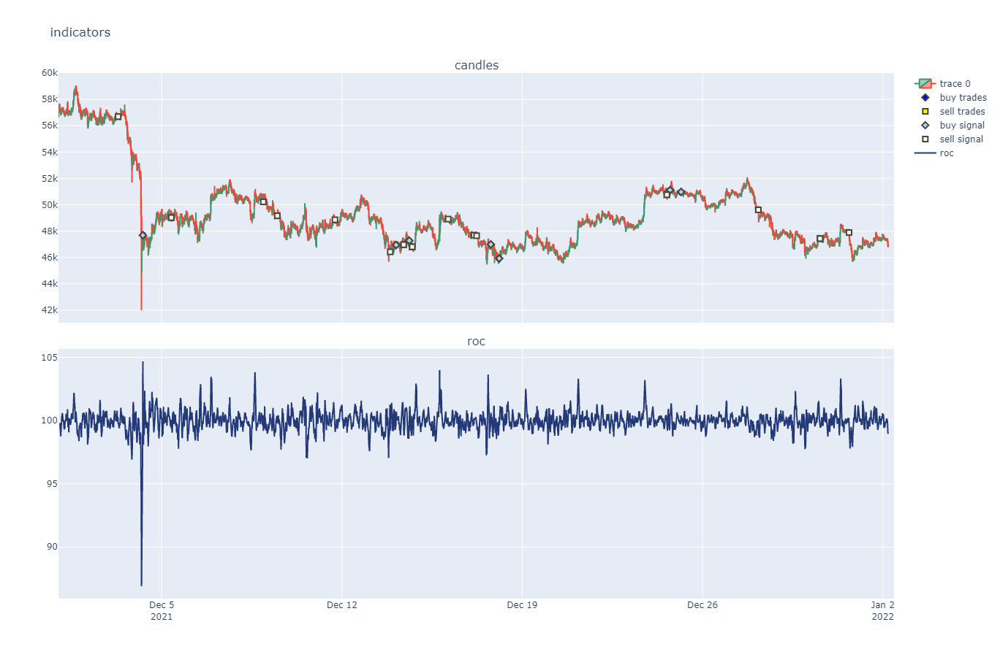

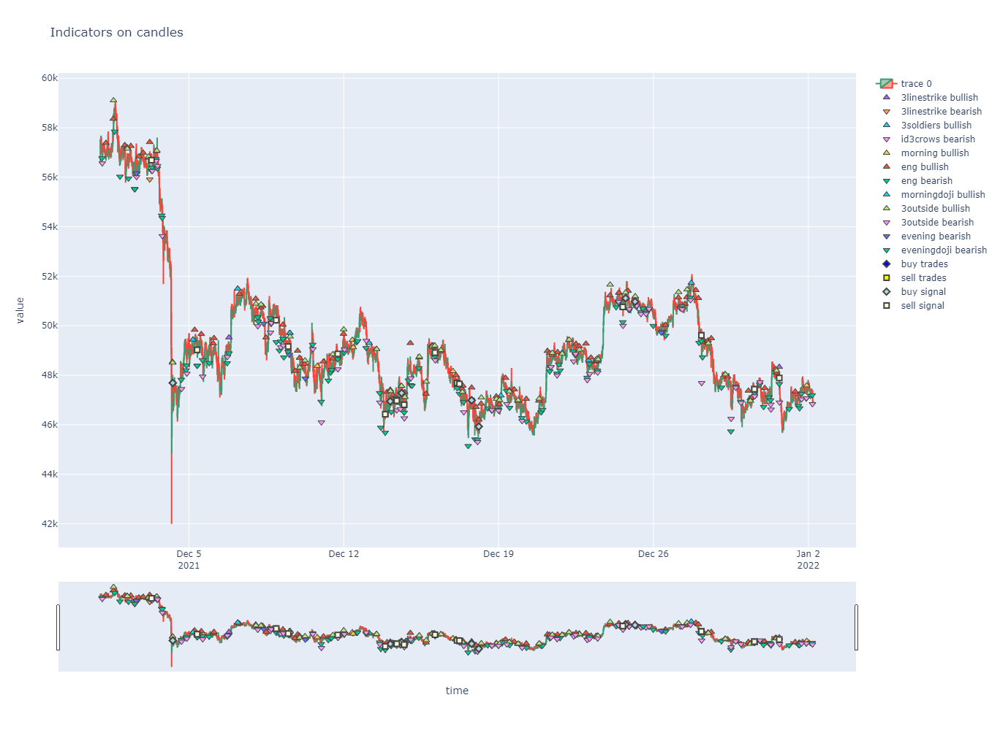

In [69]:
bot_roc2 = BacktestingBot('patterns_strategy/config.yml')
roc_results2 = bot_roc2.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc_sig, check_sell_signals_patterns_roc_sig, time_start = datetime.datetime(2021,12,1))
plot_profit(roc_results2)
plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, trades = roc_results2, show_signal=True, width=1350, height=900)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], trades=roc_results2, show_signal=True,width=1800, height=1000)

In [63]:
def check_buy_signals_patterns_roc_sig2(indicators):
    buy = False
        
    hist_roc = indicators.iloc[-2]['roc']
    act_roc = indicators.iloc[-1]['roc']
    
    interval_am = 3
    if hist_roc<99.5 and act_roc>=100.2:
        for i in range(-1, -1*(interval_am+1), -1):
            if ((indicators.iloc[i]['3stars']==100) or
                (indicators.iloc[i]['3linestrike']==-100) or
                (indicators.iloc[i]['3soldiers']==100) or
                (indicators.iloc[i]['morning']==100) or
                indicators.iloc[i]['eng']==100 or 
                (indicators.iloc[i]['3outside']==100) or
                (indicators.iloc[i]['morningdoji']==100)):
                buy = True
                break
    
    def find_min_price(indicators, interval, price_type):
        fmin_price = 1.7976931348623157e+308
        fmin_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] < fmin_price:
                fmin_price = indicators.iloc[i][price_type]
                fmin_idx = i
        return fmin_idx, fmin_price
    
    def find_max_price(indicators, interval, price_type):
        fmax_price = -1
        fmax_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] > fmax_price:
                fmax_price = indicators.iloc[i][price_type]
                fmax_idx = i
        return fmax_idx, fmax_price
    
    if ((indicators.iloc[-1]['3stars']==100) or
        (indicators.iloc[-1]['3linestrike']==-100) or
        (indicators.iloc[-1]['3soldiers']==100) or
        (indicators.iloc[-1]['morning']==100) or
        (indicators.iloc[-1]['3outside']==100) or
        (indicators.iloc[-1]['morningdoji']==100)): # sygnał wzrostu
        
        act_roc = indicators.iloc[-1]['roc']

        idx_max, max_price = find_max_price(indicators, 55, 'close')
        act_price = indicators.iloc[-1]['close']
        price_diff_max = act_price - max_price

        idx_min, min_price = find_min_price(indicators, 55, 'close')
        act_price = indicators.iloc[-1]['close']
        price_diff_min = act_price - min_price
            
        if price_diff_max > price_diff_min:
            price_diff = price_diff_max
            idx = idx_max
        else:
            price_diff = price_diff_min
            idx = idx_min    
        
        roc = indicators.iloc[idx]['roc']
        
        roc_diff = act_roc - roc
        
        if roc_diff > 0 and price_diff < 0: 
            buy = True
        # elif roc_diff > 0 and price_diff > 0: 
        #     buy = True
    
    return buy


def check_sell_signals_patterns_roc_sig2(indicators):
    sell = False
    
    hist_roc = indicators.iloc[-2]['roc']
    act_roc = indicators.iloc[-1]['roc']    
    
    interval_am = 3
    if(hist_roc>100.2 and act_roc<=99.5):
        for i in range(-1, -1*(interval_am+1), -1):
            if(indicators.iloc[i]['id3crows']==-100 or
                indicators.iloc[i]['eng']==-100 or 
                indicators.iloc[i]['3crows']==-100 or
                indicators.iloc[i]['evening']==-100 or
                indicators.iloc[i]['3linestrike']==100 or
                indicators.iloc[i]['eveningdoji']==-100):
                sell = True
                break
     
    
    def find_max_price(indicators, interval, price_type):
        fmax_price = -1
        fmax_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] > fmax_price:
                fmax_price = indicators.iloc[i][price_type]
                fmax_idx = i
        return fmax_idx, fmax_price
    
    def find_min_price(indicators, interval, price_type):
        fmin_price = 1.7976931348623157e+308
        fmin_idx = -1
        for i in range(-2, -1*(interval+1), -1):
            if indicators.iloc[i][price_type] < fmin_price:
                fmin_price = indicators.iloc[i][price_type]
                fmin_idx = i
        return fmin_idx, fmin_price
    
    if(indicators.iloc[-1]['id3crows']==-100 or
        indicators.iloc[-1]['eng']==-100 or 
        indicators.iloc[-1]['3crows']==-100 or
        indicators.iloc[-1]['evening']==-100 or
        indicators.iloc[-1]['3linestrike']==100 or
        indicators.iloc[-1]['eveningdoji']==-100):
        
        act_roc = indicators.iloc[-1]['roc']

        idx_max, max_price = find_max_price(indicators, 55, 'close')
        act_price = indicators.iloc[-1]['close']
        price_diff_max = act_price - max_price

        idx_min, min_price = find_min_price(indicators, 55, 'close')
        act_price = indicators.iloc[-1]['close']
        price_diff_min = act_price - min_price
        
        if price_diff_max > price_diff_min:
            price_diff = price_diff_max
            idx = idx_max
        else:
            price_diff = price_diff_min
            idx = idx_min
        
        roc = indicators.iloc[idx]['roc']
        
        roc_diff = act_roc - roc
        
        if roc_diff < 0 and price_diff > 0:
            sell = True
        # elif roc_diff < 0 and price_diff < 0:
        #     sell = True               
    
    return sell


# def check_buy_signals_patterns_roc(indicators):
#     buy = False
    
#     def find_min_price(indicators, interval, price_type):
#         fmin_price = 1.7976931348623157e+308
#         fmin_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] < fmin_price:
#                 fmin_price = indicators.iloc[i][price_type]
#                 fmin_idx = i
#         return fmin_idx, fmin_price
    
#     def find_max_price(indicators, interval, price_type):
#         fmax_price = -1
#         fmax_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] > fmax_price:
#                 fmax_price = indicators.iloc[i][price_type]
#                 fmax_idx = i
#         return fmax_idx, fmax_price
    
#     if ((indicators.iloc[-1]['3stars']==100) or
#         (indicators.iloc[-1]['3linestrike']==-100) or
#         (indicators.iloc[-1]['3soldiers']==100) or
#         (indicators.iloc[-1]['morning']==100) or
#         (indicators.iloc[-1]['3outside']==100) or
#         (indicators.iloc[-1]['morningdoji']==100)): # sygnał wzrostu
        
#         act_roc = indicators.iloc[-1]['roc']
#         if act_roc > 100:
#             idx, max_price = find_max_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - max_price
#         else:
#             idx, min_price = find_min_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - min_price
            
#         roc = indicators.iloc[idx]['roc']
        
#         roc_diff = act_roc - roc
        
#         if roc_diff > 0 and price_diff <= 0: 
#             buy = True
#         elif roc_diff >=0 and price_diff >= 0: 
#             buy = True
    
#     return buy


# def check_sell_signals_patterns_roc(indicators):
#     sell = False
    
#     def find_max_price(indicators, interval, price_type):
#         fmax_price = -1
#         fmax_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] > fmax_price:
#                 fmax_price = indicators.iloc[i][price_type]
#                 fmax_idx = i
#         return fmax_idx, fmax_price
    
#     def find_min_price(indicators, interval, price_type):
#         fmin_price = 1.7976931348623157e+308
#         fmin_idx = -1
#         for i in range(-2, -1*(interval+1), -1):
#             if indicators.iloc[i][price_type] < fmin_price:
#                 fmin_price = indicators.iloc[i][price_type]
#                 fmin_idx = i
#         return fmin_idx, fmin_price
    
#     if(indicators.iloc[-1]['id3crows']==-100 or
#         indicators.iloc[-1]['eng']==-100 or 
#         indicators.iloc[-1]['3crows']==-100 or
#         indicators.iloc[-1]['evening']==-100 or
#         indicators.iloc[-1]['3linestrike']==100 or
#         indicators.iloc[-1]['eveningdoji']==-100):
        
#         act_roc = indicators.iloc[-1]['roc']
#         if act_roc > 100:
#             idx, max_price = find_max_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - max_price
#         else:
#             idx, min_price = find_min_price(indicators, 60, 'close')
#             act_price = indicators.iloc[-1]['close']
#             price_diff = act_price - min_price
            
#         roc = indicators.iloc[idx]['roc']
        
#         roc_diff = act_roc - roc
        
#         if roc_diff < 0 and price_diff >= 0:
#             sell = True
#         elif roc_diff <= 0 and price_diff <= 0:
#             sell = True        
    
#     return sell




/tmp/ipykernel_360/246763630.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/24676

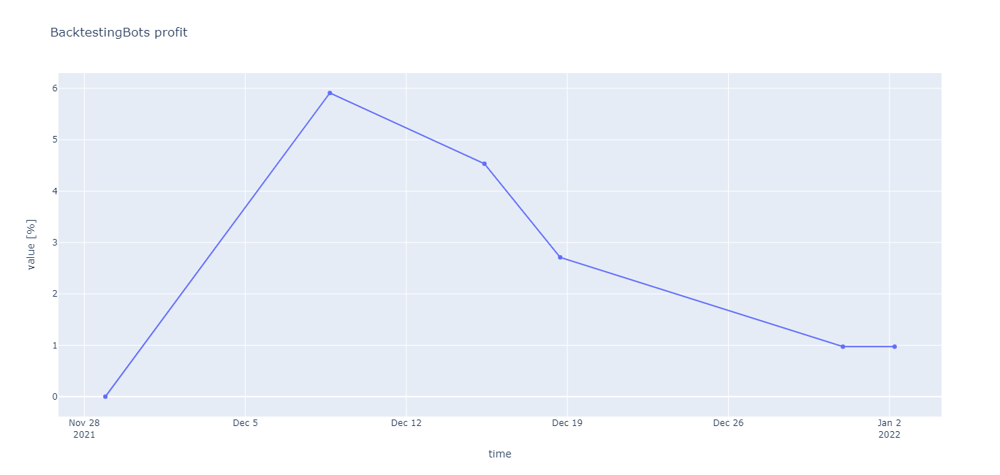

['candles', 'roc']


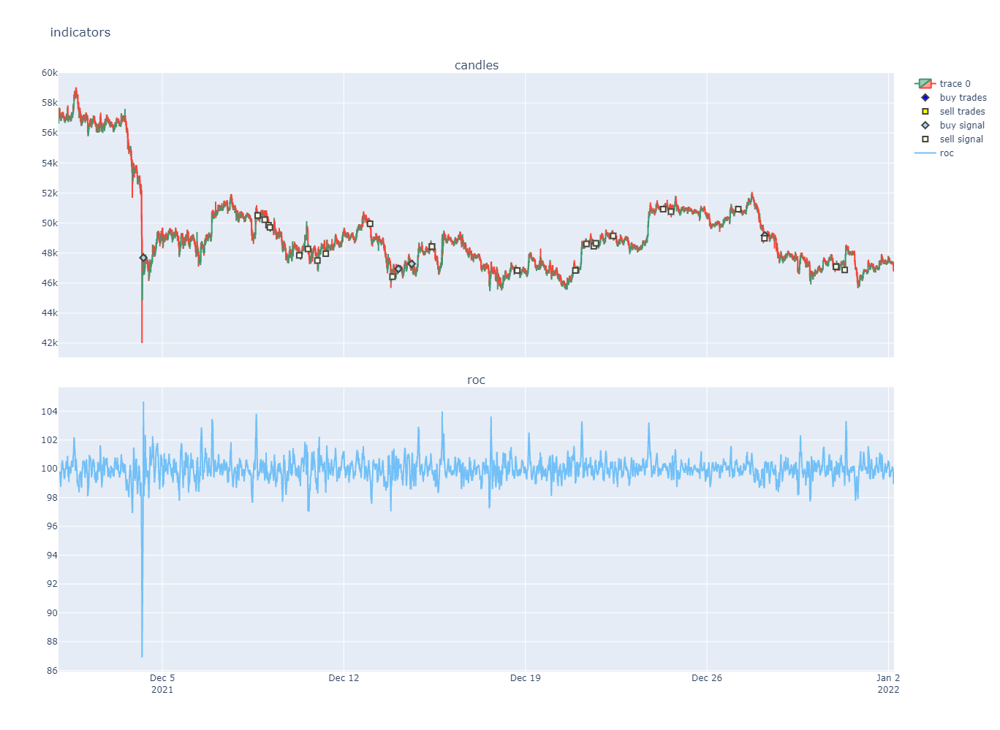

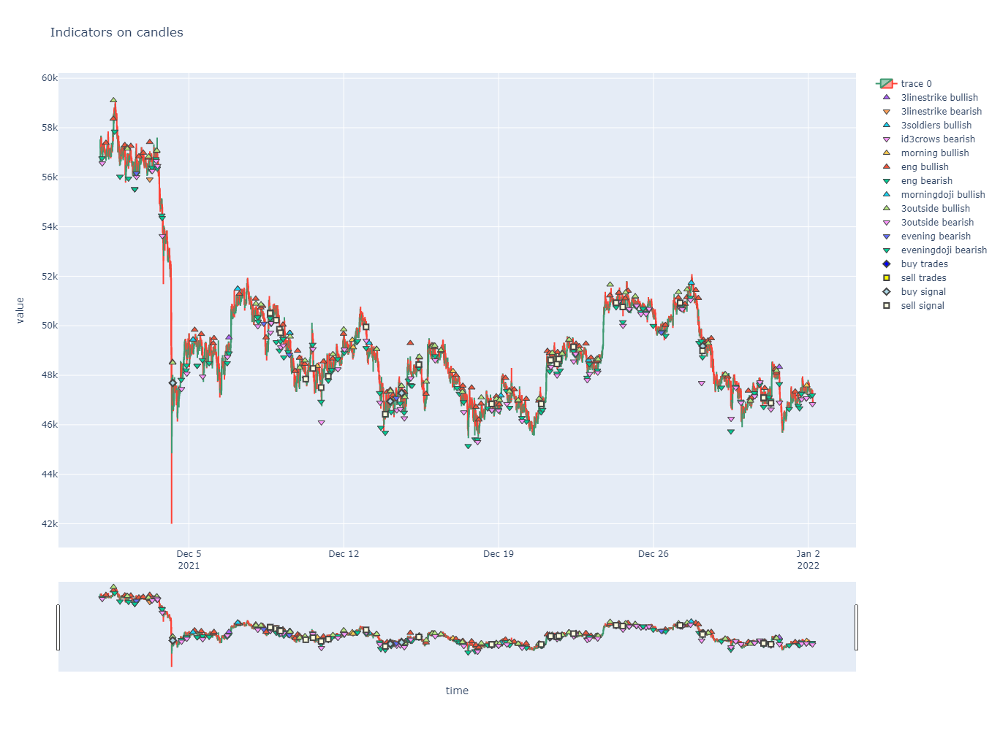

In [64]:
bot_roc3 = BacktestingBot('patterns_strategy/config.yml')
roc_results3 = bot_roc3.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc_sig2, check_sell_signals_patterns_roc_sig2, time_start = datetime.datetime(2021,12,1))
plot_profit(roc_results3)
plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, trades = roc_results3, show_signal=True, width=1800, height=1000)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], trades=roc_results3, show_signal=True,width=1800, height=1000)

In [65]:
def check_buy_signals_patterns_roc_sig2(indicators):
    buy = False
        
    hist_roc = indicators.iloc[-2]['roc']
    act_roc = indicators.iloc[-1]['roc']
    
    interval_am = 3
    if hist_roc<99.5 and act_roc>=100.2:
        for i in range(-1, -1*(interval_am+1), -1):
            if ((indicators.iloc[i]['3stars']==100) or
                (indicators.iloc[i]['3linestrike']==-100) or
                (indicators.iloc[i]['3soldiers']==100) or
                (indicators.iloc[i]['morning']==100) or
                indicators.iloc[i]['eng']==100 or 
                (indicators.iloc[i]['3outside']==100) or
                (indicators.iloc[i]['morningdoji']==100)):
                buy = True
                break
    
    return buy


def check_sell_signals_patterns_roc_sig2(indicators):
    sell = False
    
    hist_roc = indicators.iloc[-2]['roc']
    act_roc = indicators.iloc[-1]['roc']    
    
    interval_am = 3
    if(hist_roc>100.2 and act_roc<=99.5):
        for i in range(-1, -1*(interval_am+1), -1):
            if(indicators.iloc[i]['id3crows']==-100 or
                indicators.iloc[i]['eng']==-100 or 
                indicators.iloc[i]['3crows']==-100 or
                indicators.iloc[i]['evening']==-100 or
                indicators.iloc[i]['3linestrike']==100 or
                indicators.iloc[i]['eveningdoji']==-100):
                sell = True
                break            
    
    return sell

In [70]:
# %load template_strategy.py
#------Do not change those imports------
from pandas import DataFrame
from bot_entity.bot import Bot
import talib.abstract as ta
from technical.util import resample_to_interval, resampled_merge
#---------------------------------------



# Do not change class and methods names

class Strategy(Bot):

    def calc_indicators(self, candles:DataFrame):
        candles['rsi'] = ta.RSI(candles, timeperiod=10)
        candles['roc'] = ta.ROCR100(candles, timeperiod=5)

        candles['3stars'] = ta.CDL3STARSINSOUTH(candles)
        candles['3linestrike'] = ta.CDL3LINESTRIKE(candles)
        candles['3soldiers'] = ta.CDL3WHITESOLDIERS(candles)
        candles['id3crows'] = ta.CDLIDENTICAL3CROWS(candles)
        candles['morning'] = ta.CDLMORNINGSTAR(candles)
        candles['eng'] = ta.CDLENGULFING(candles)
        candles['3crows'] = ta.CDL3BLACKCROWS(candles)
        candles['morningdoji'] = ta.CDLMORNINGDOJISTAR(candles)
        candles['3outside'] = ta.CDL3OUTSIDE(candles)
        candles['evening'] = ta.CDLEVENINGSTAR(candles)
        candles['eveningdoji'] = ta.CDLEVENINGDOJISTAR(candles)
        return candles


    def check_buy_signals(self, indicators):
        buy = False
        
        hist_roc = indicators.iloc[-2]['roc']
        act_roc = indicators.iloc[-1]['roc']

        interval_am = 3
        if hist_roc<99.5 and act_roc>=100.2:
            for i in range(-1, -1*(interval_am+1), -1):
                if ((indicators.iloc[i]['3stars']==100) or
                    (indicators.iloc[i]['3linestrike']==-100) or
                    (indicators.iloc[i]['3soldiers']==100) or
                    (indicators.iloc[i]['morning']==100) or
                    indicators.iloc[i]['eng']==100 or 
                    (indicators.iloc[i]['3outside']==100) or
                    (indicators.iloc[i]['morningdoji']==100)):
                    buy = True
                    break

        return buy


    def check_sell_signals(self, indicators):
         sell = False
        hist_roc = indicators.iloc[-2]['roc']
        act_roc = indicators.iloc[-1]['roc']    

        interval_am = 3
        if(hist_roc>100.2 and act_roc<=99.5):
            for i in range(-1, -1*(interval_am+1), -1):
                if(indicators.iloc[i]['id3crows']==-100 or
                    indicators.iloc[i]['eng']==-100 or 
                    indicators.iloc[i]['3crows']==-100 or
                    indicators.iloc[i]['evening']==-100 or
                    indicators.iloc[i]['3linestrike']==100 or
                    indicators.iloc[i]['eveningdoji']==-100):
                    sell = True
                    break            

        return sell



/tmp/ipykernel_360/246763630.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/24676

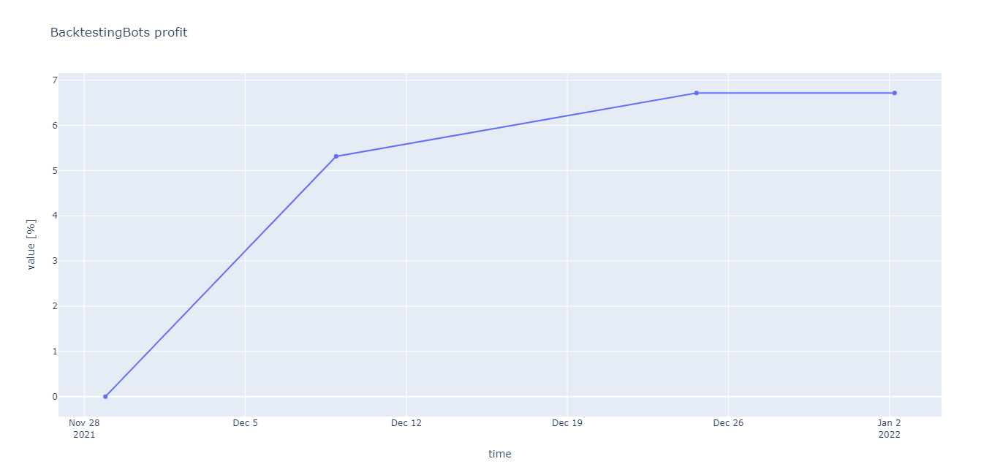

['candles', 'roc']


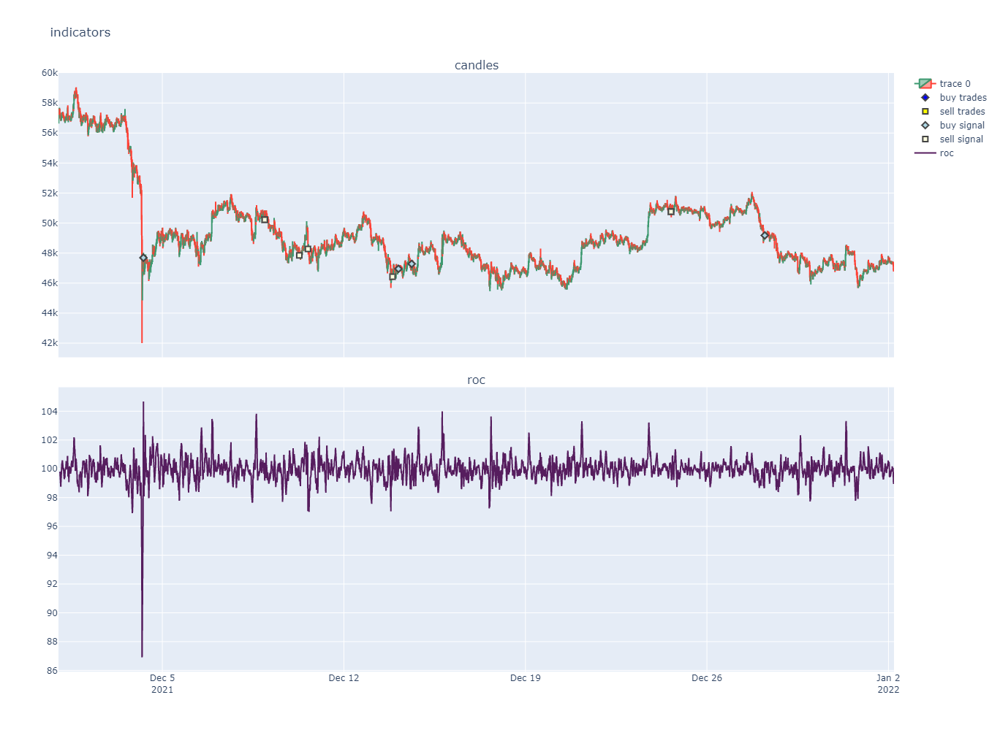

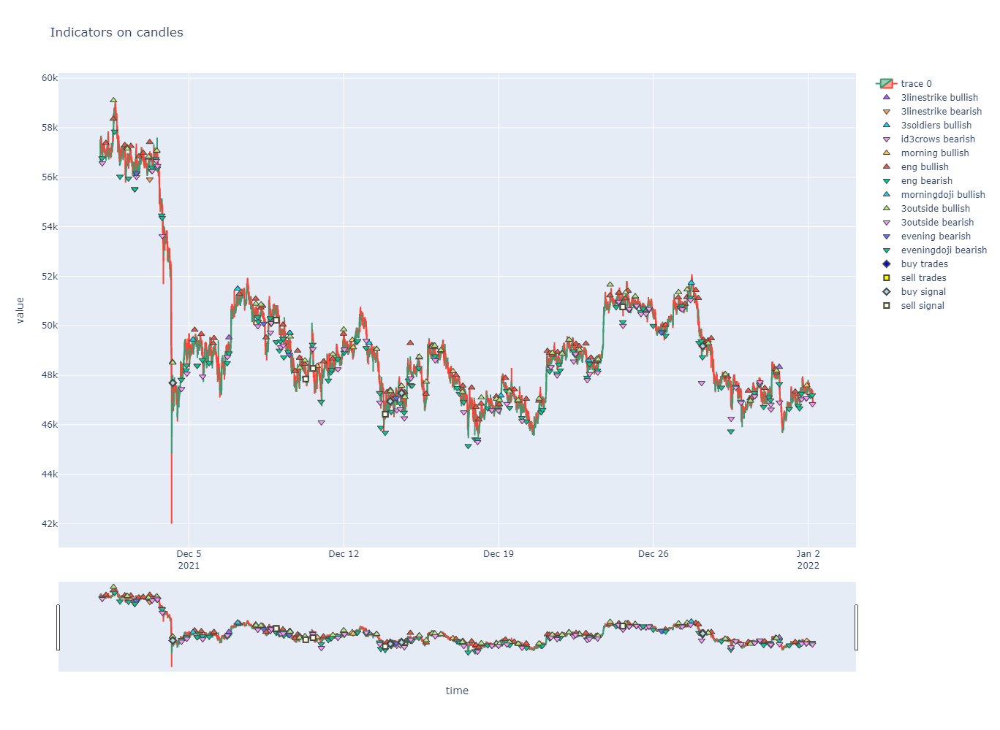

In [66]:
bot_roc3 = BacktestingBot('patterns_strategy/config.yml')
roc_results3 = bot_roc3.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc_sig2, check_sell_signals_patterns_roc_sig2, time_start = datetime.datetime(2021,12,1))
plot_profit(roc_results3)
plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, trades = roc_results3, show_signal=True, width=1800, height=1000)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], trades=roc_results3, show_signal=True,width=1800, height=1000)

/tmp/ipykernel_360/246763630.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/246763630.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_360/24676

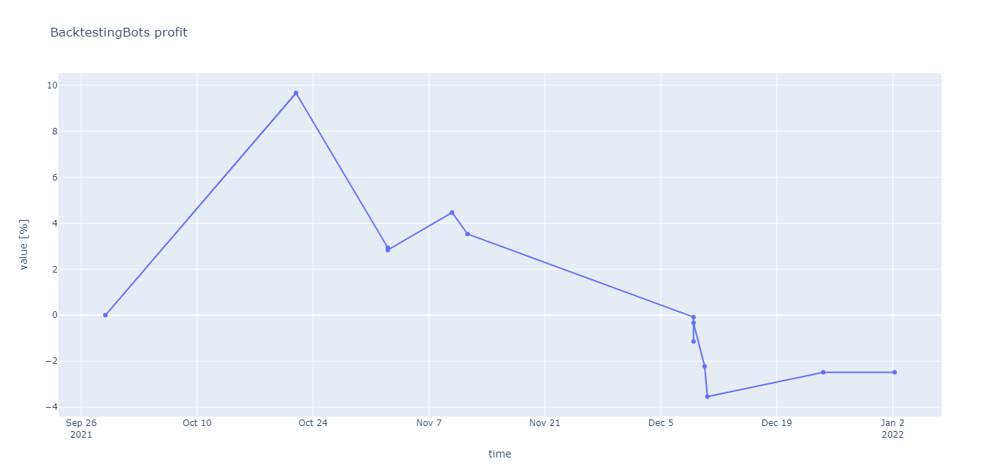

['candles', 'roc']


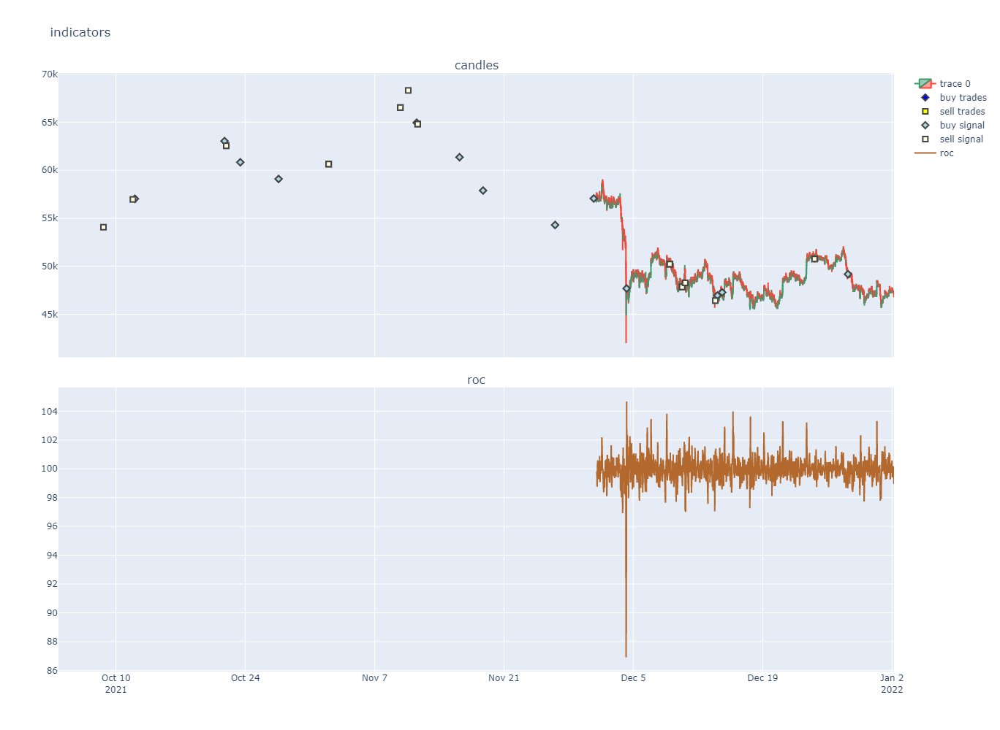

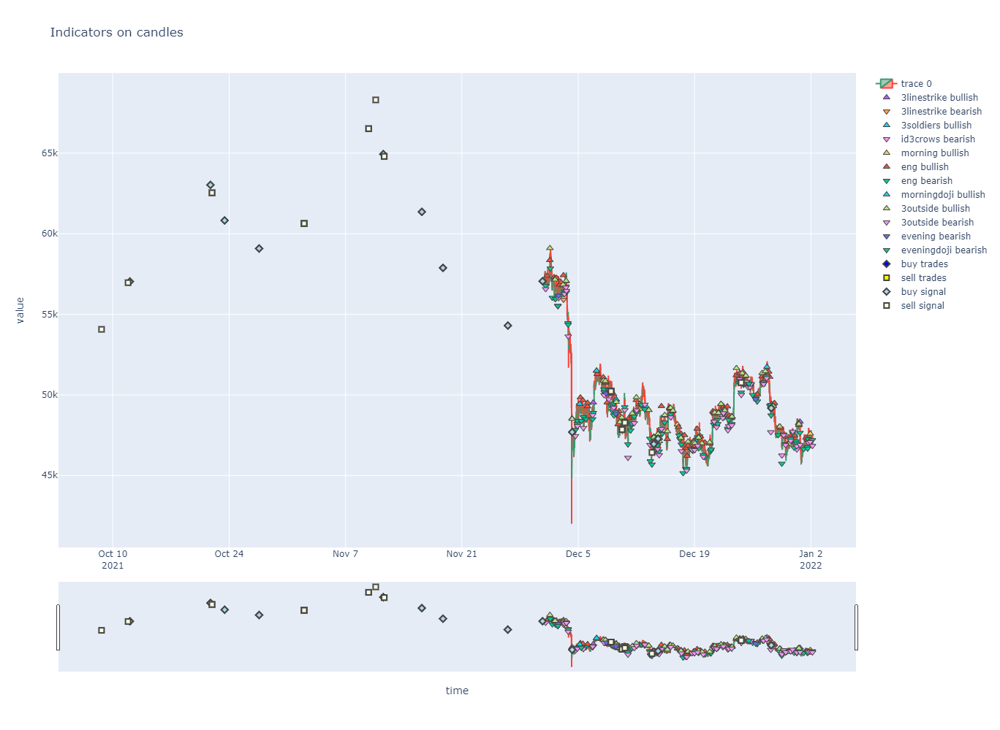

In [67]:
bot_roc3 = BacktestingBot('patterns_strategy/config.yml')
roc_results3 = bot_roc3.test_strategy(calc_indicators_roc, check_buy_signals_patterns_roc_sig2, check_sell_signals_patterns_roc_sig2, time_start = datetime.datetime(2021,10,1))
plot_profit(roc_results3)
plot_indicators(candles, ['roc'], one_plot=[False], plot_candles=True, trades = roc_results3, show_signal=True, width=1800, height=1000)
plot_patterns_on_candles(candles, ['3stars','3linestrike','3soldiers','id3crows','morning','eng','3crows','morningdoji','3outside','evening','eveningdoji'], trades=roc_results3, show_signal=True,width=1800, height=1000)